# Домашняя работа: ASR для call-центра

## Контекст

Представим, что компания хочет улучшить качество распознавания речи операторов колл-центра с индийским акцентом. Вам необходимо исследовать, насколько хорошо базовая модель Whisper справляется с такой речью и помогает ли её дополнительное обучение на специализированном наборе данных.
Задача - сравнить качество исходной и дообученной моделей и проанализировать полученные результаты.

## Что вы будете делать

1. Возьмёте реальные записи индийского английского как обучающие данные
2. Сгенерируете свой собственный тестовый набор — 20 типичных call-центровых фраз, озвученных с индийским акцентом через TTS
3. Замерите baseline WER замороженной модели на этих звонках
4. Дообучите Whisper с LoRA на реальных индийских данных
5. Сравните до/после и разберёте конкретные ошибки

Ссылка для сдачи ДЗ: https://forms.gle/yPwBt3ZV3JikENaS7

In [1]:
# Установка зависимостей
#   transformers — Whisper и SpeechT5
#   peft — LoRA-адаптеры для эффективного файнтюнинга
#   torchaudio — ресемплинг аудио
#   soundfile  — чтение/запись wav
#   jiwer — расчёт WER и пословный анализ ошибок
#   accelerate — mixed precision и оптимизация обучения
#   speechbrain — извлечение speaker embeddings из реальных записей

!pip install -q transformers datasets peft torchaudio soundfile jiwer accelerate speechbrain

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 24.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 81.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 788.2/788.2 kB 30.6 MB/s eta 0:00:00


---
## 1. Загрузка данных - 1 балл

Загружаем реальные обучающие данные и генерируем синтетический тестовый набор.

Загружаем Svarah, Indian-accented English ASR dataset, который включает в себя 9.6 часов индийского английского, 117 дикторов, ~1GB.

Датасет `ai4bharat/Svarah` требует авторизации и принятия условий доступа на Hugging Face.

Перед запуском кода нужно:

1. Открыть страницу датасета `ai4bharat/Svarah` на Hugging Face.
2. Принять условия доступа к датасету.
3. Создать или скопировать свой Hugging Face access token.
4. Вставить токен в Colab через переменную окружения.

In [ ]:


from datasets import load_dataset

dataset = load_dataset(
     "ai4bharat/Svarah",
     split="test",
     token=os.environ["HF_TOKEN"]
)



README.md:   0%|          | 0.00/4.30k [00:00<?, ?B/s]

data/test-00000-of-00003.parquet:   0%|          | 0.00/365M [00:00<?, ?B/s]

data/test-00001-of-00003.parquet:   0%|          | 0.00/360M [00:00<?, ?B/s]

data/test-00002-of-00003.parquet:   0%|          | 0.00/370M [00:00<?, ?B/s]

Generating test split:   0%|          | 0/6656 [00:00<?, ? examples/s]

In [7]:
import torch
import re
import torchaudio
import numpy as np
from dataclasses import dataclass
from typing import Any, Dict, List, Union

from datasets import load_dataset, Dataset, Audio as HFAudio
from transformers import (
    WhisperProcessor,
    WhisperForConditionalGeneration,
    SpeechT5Processor,
    SpeechT5ForTextToSpeech,
    SpeechT5HifiGan,
    Seq2SeqTrainer,
    Seq2SeqTrainingArguments,
)
from peft import LoraConfig, get_peft_model, TaskType
from jiwer import wer, process_words

import matplotlib.pyplot as plt
from IPython.display import Audio, display

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Устройство: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Устройство: cuda
GPU: Tesla T4


###Отберите 600 примеров из датасета - 0,5 балла

1. Проитерируйтесь по датасету `svarah`.

2. Отфильтруйте аудиофрагменты по длительности: пропускайте примеры,которые превышают MAX_DURATION.

3. Для каждого подходящего примера извлеките аудиомассив, частоту дискретизации и транскрипцию:

   - аудиомассив (`sample["audio_filepath"]["array"]`);
   - частота дискретизации (sampling_rate);
   - транскрипция.

4. Если частота дискретизации не равна `16000`, приведите аудио к `16 kHz` с помощью `torchaudio`.

5. Преобразуйте аудиомассив в формат `np.float32`.

6. Добавьте обработанный пример в список `collected` в следующем формате:

   ```python
   {
       "audio": {
           "array": аудиомассив,
           "sampling_rate": 16000
       },
       "sentence": текстовая_расшифровка
   }
7. Когда количество примеров достигнет TARGET(600), остановите процесс

In [ ]:
svarah = load_dataset("ai4bharat/Svarah", split="test", streaming=True, token=os.environ["HF_TOKEN"])

In [ ]:
svarah

IterableDataset({
    features: ['audio_filepath', 'duration', 'text', 'gender', 'age-group', 'primary_language', 'native_place_state', 'native_place_district', 'highest_qualification', 'job_category', 'occupation_domain'],
    num_shards: 3
})

In [ ]:
TARGET = 600
MAX_DURATION = 20.0

collected = []

for sample in svarah:
    if len(collected) >= TARGET:
        break

    audio_info = sample["audio_filepath"]
    audio_array = audio_info["array"]
    sr = audio_info["sampling_rate"]
    text = sample["text"]

    duration = sample.get("duration", len(audio_array) / sr)
    if duration > MAX_DURATION:
        continue

    if sr != 16000:
        audio_tensor = torch.tensor(audio_array).float().unsqueeze(0)
        audio_array = torchaudio.functional.resample(audio_tensor, sr, 16000).squeeze().numpy()

    audio_array = audio_array.astype(np.float32)

    collected.append({
        "audio": {
            "array": audio_array,
            "sampling_rate": 16000
        },
        "sentence": text
    })

print(len(collected))

600


### Создание объекта Dataset - 0,5 балла

На этом шаге вам нужно преобразовать список `collected` в объект `Dataset` [(можно посмотреть подробнее здесь)](https://huggingface.co/docs/datasets/loading) из библиотеки Hugging Face `datasets`.

1. Извлеките из списка `collected` отдельно:

   * аудиомассивы;
   * текстовые транскрипции.

2. Создайте датасет `train_real` с помощью `Dataset.from_dict`.

3. При создании датасета явно укажите структуру данных через `Features`:

   * колонка `"audio"` должна иметь тип `HFAudio(sampling_rate=16000)`;
   * колонка `"sentence"` должна иметь тип `Value("string")`.

4. Для колонки `"audio"` сохраните каждый пример в формате:

   ```python
   {
       "array": аудиомассив,
       "sampling_rate": 16000
   }
   ```

5. После создания датасета выведите количество записей в `train_real`.

В результате у вас должен получиться датасет `train_real`, где аудио уже приведено к формату Hugging Face Audio с частотой дискретизации `16 kHz`, а текстовые расшифровки хранятся в колонке `"sentence"`.


In [2]:
from datasets import Features, Value

In [ ]:
from datasets import Features, Value


audio_col = [item["audio"] for item in collected]
sentence_col = [item["sentence"] for item in collected]

train_real = Dataset.from_dict(
    {
        "audio": audio_col,
        "sentence": sentence_col
    },
    features=Features({
        "audio": HFAudio(sampling_rate=16000),
        "sentence": Value("string")
    }),
)

print(len(train_real))

600


Стриминг данных — довольно долгий шаг. Чтобы не повторять его при каждом переподключении Colab, сохраните собранную выборку на Google Drive ячейкой ниже. При следующем запуске она загрузится за секунды.

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
import os
CACHE_PATH = "/content/drive/MyDrive/whisper_hw4_cache"

In [ ]:
train_real.save_to_disk(CACHE_PATH)
print("Сохранено на Drive")

Saving the dataset (0/1 shards):   0%|          | 0/600 [00:00<?, ? examples/s]

Сохранено на Drive


In [10]:
from datasets import load_from_disk
train_real = load_from_disk(CACHE_PATH)
print(f"Загружено из кэша: {len(train_real)} записей")

Загружено из кэша: 600 записей


In [7]:
print("Примеры из обучающей выборки:\n")
for i in range(10):
    sample = train_real[i]
    print(f"[{i}] Текст: {sample['sentence']}")
    display(Audio(sample["audio"]["array"], rate=sample["audio"]["sampling_rate"]))
    print()

Примеры из обучающей выборки:

[0] Текст: Our district Hasana was the land of the great Hoysala dynasty who ruled over this region from 11th to 14th century CE.



[1] Текст: There is a gradual shift in the mentality



[2] Текст: Wow



[3] Текст: Nipah virus belongs to  the



[4] Текст: How much money is left in my Arunachal Pradesh Rural Bank account?



[5] Текст: Govinda has received 12 Filmfare Award nominations and 4 Zee Cine Awards.



[6] Текст: There are many big rivers



[7] Текст: where it is joined by other branches to form the Brahmaputra



[8] Текст: There have been many attempts recently to make sure that the people maintain their



[9] Текст: Jammu, Samba, Kathua, Rajouri, Poonch


##2. Генерация синтетического набора данных - 3,5 балла

Реальных записей call-центра с индийским акцентом в открытых датасетах нет, поэтому генерируем сами через SpeechT5 с реальным Indian speaker embedding.
Нам нужен тестовый набор, где будут реалистичные для call центра фразы.


Что необходимо сделать:
1.   Необходимо написать функцию `extract_speaker_embedding` и собрать несколько голосов из датасета, которые позволят сгенерировать речь с акцентом - 1 балл
3. Придумать 20 фраз для генерации с усложнением - 1 балл
4. Сгенерировать эти фразы с помощью TTS и сохранить как HF Dataset - 1 балл
5. Проанализировать результаты генерации - 0,5 балла



In [37]:
#Загружаем SpeechT5 и vocoder...
tts_processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_tts")
tts_model     = SpeechT5ForTextToSpeech.from_pretrained("microsoft/speecht5_tts").to(device)
vocoder       = SpeechT5HifiGan.from_pretrained("microsoft/speecht5_hifigan").to(device)
tts_model.eval()
vocoder.eval()

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

[transformers] SpeechT5ForTextToSpeech LOAD REPORT from: microsoft/speecht5_tts
Key                                         | Status     |  | 
--------------------------------------------+------------+--+-
speecht5.decoder.prenet.encode_positions.pe | UNEXPECTED |  | 
speecht5.encoder.prenet.encode_positions.pe | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
[transformers] You are using a model of type `hifigan` to instantiate a model of type `speecht5_hifigan`. This may be expected if you are loading a checkpoint that shares a subset of the architecture (e.g., loading a `sam2_video` checkpoint into `Sam2Model`), but is otherwise not supported and can yield errors. Please verify that the checkpoint is compatible with the model you are instantiating.


Loading weights:   0%|          | 0/158 [00:00<?, ?it/s]

SpeechT5HifiGan(
  (conv_pre): Conv1d(80, 512, kernel_size=(7,), stride=(1,), padding=(3,))
  (upsampler): ModuleList(
    (0): ConvTranspose1d(512, 256, kernel_size=(8,), stride=(4,), padding=(2,))
    (1): ConvTranspose1d(256, 128, kernel_size=(8,), stride=(4,), padding=(2,))
    (2): ConvTranspose1d(128, 64, kernel_size=(8,), stride=(4,), padding=(2,))
    (3): ConvTranspose1d(64, 32, kernel_size=(8,), stride=(4,), padding=(2,))
  )
  (resblocks): ModuleList(
    (0): HifiGanResidualBlock(
      (convs1): ModuleList(
        (0): Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(1,))
        (1): Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(3,), dilation=(3,))
        (2): Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(5,), dilation=(5,))
      )
      (convs2): ModuleList(
        (0-2): 3 x Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(1,))
      )
    )
    (1): HifiGanResidualBlock(
      (convs1): ModuleList(
        (0): Conv1d(256, 256,

In [38]:
# Загружаем speaker encoder для извлечения x-vectors
# x-vector — стандартный 512-мерный embedding идентичности диктора
# Используем модель из SpeechBrain, обученную на VoxCeleb

# С SpeechBrain 1.0 модуль переименован: speechbrain.pretrained → speechbrain.inference
try:
    from speechbrain.inference import EncoderClassifier
except ImportError:
    from speechbrain.pretrained import EncoderClassifier

spk_encoder = EncoderClassifier.from_hparams(
    source="speechbrain/spkrec-xvect-voxceleb",
    run_opts={"device": str(device)},
    savedir="./pretrained_models/spkrec-xvect"
)


INFO:speechbrain.utils.fetching:Fetch hyperparams.yaml: Using symlink found at '/content/pretrained_models/spkrec-xvect/hyperparams.yaml'
INFO:speechbrain.utils.fetching:Fetch embedding_model.ckpt: Using symlink found at '/content/pretrained_models/spkrec-xvect/embedding_model.ckpt'
INFO:speechbrain.utils.fetching:Fetch mean_var_norm_emb.ckpt: Using symlink found at '/content/pretrained_models/spkrec-xvect/mean_var_norm_emb.ckpt'
INFO:speechbrain.utils.fetching:Fetch classifier.ckpt: Using symlink found at '/content/pretrained_models/spkrec-xvect/classifier.ckpt'
INFO:speechbrain.utils.fetching:Fetch label_encoder.txt: Using symlink found at '/content/pretrained_models/spkrec-xvect/label_encoder.ckpt'
INFO:speechbrain.utils.parameter_transfer:Loading pretrained files for: embedding_model, mean_var_norm_emb, classifier, label_encoder


###2.1 Извлечение speaker_embedding -0,5 балла

In [39]:
def extract_speaker_embedding(audio_array, sr=16000):
    """
    Извлекает 512-мерный x-vector из аудио.

    Pipeline:
      аудио → ресемплинг до 16kHz → speaker encoder → embedding (1,1,512) → squeeze → (512,)

    Args:
        audio_array: numpy waveform
        sr:          sample rate входного аудио

    Returns:
        torch.Tensor формы (512,) на CPU
    """
    # Преобразуйте numpy audio_array в torch.Tensor типа float
    audio_tensor =  torch.tensor(audio_array, dtype=torch.float32)

    if sr != 16000:
        # Сделайте resample с помощью torchaudio
        audio_tensor = torchaudio.functional.resample(audio_tensor, sr, 16000)

    # Добавьте размерность батча и перенесите тензор на устройство
    #Должно быть (1, n_samples)
    audio_tensor = audio_tensor.unsqueeze(0).to(device)

    # Отключите вычисление градиентов
    with torch.no_grad():
        embedding = spk_encoder.encode_batch(audio_tensor)

    # Уберите лишние размерности (с (1, 1, 512) на (512,)) и перенесите результат на CPU
    embedding = embedding.squeeze().cpu()
    return embedding


###Подбор speaker_embedding - 0,5 балла

In [40]:
import random
indices = list(range(len(train_real)))
random.seed(48)            # фиксируем seed для воспроизводимости
random.shuffle(indices)
# Извлекаем несколько эмбеддингов от разных дикторов для разнообразия
#Здесь стоит поэкспериментировать с seed-ом и подобрать , которые будут искажать речь достаточно сильно
speaker_embeddings = []

for idx in indices:
    sample = train_real[idx]
    # Посчитайте длительность записи в секундах
    # (длина массива делёная на sampling_rate)
    duration = len(sample["audio"]["array"]) / sample["audio"]["sampling_rate"]

    # Берём только записи длиннее 5 секунд
    if duration >= 5.0:
        # Извлеките embedding с помощью extract_speaker_embedding
        emb = extract_speaker_embedding(sample["audio"]["array"], sample["audio"]["sampling_rate"])

        # Приведите к форме (1, 512), перенесите на device и добавьте в список
        speaker_embeddings.append(emb.unsqueeze(0).to(device))

    # Останавливаемся, когда набрали 15 голосов
    if len(speaker_embeddings) >= 15:
        break

print(f"Собрано голосов: {len(speaker_embeddings)}")

Собрано голосов: 15


###Создаем скрипты для озвучивания - 1 балл

In [41]:
# 20-30 типичных фраз, которые встречаются в реальной работе агента поддержки
# Специально включите сложные элементы:
#   - числа ("twenty four hours", "fifty dollars")
#   - сложные имена собственные ("McDougle")
#   - соответствующая лексика ("dispatched", "escalated", "subscription")
#   - вежливые формулы ("apologize for the inconvenience")

CALL_CENTER_SCRIPTS = [
    "I have updated your delivery address to four two five Oak Street.",
    "Your package was shipped via FedEx and is currently in transit.",
    "Please log in to your account on our website to confirm.",
    "Please note your support ticket number is seven three nine zero.",
    "Your order reference is A B 1jkfgjf.",
    "Thank you for calling, how may I assist you today?",
    "I completely understand your frustration, and I am here to help you resolve this issue as quickly as possible.",
    "Could you please spell your last name for me, letter by letter, to ensure I have the correct spelling?",
    "I have updated your delivery address to four two five Green Street, apartment seven zero seven.",
    "Your package was dispatched via Amazon and is currently in transit, with an estimated delivery of three to five business days.",
    "Please note your support ticket number is seven three nine zero, and your order reference is A B one J K F three G J F.",
    "I have checked your tracking number A B nine four X Y Z, and it shows the parcel is at the Mumbai sorting facility.",
    "Your express shipment has cleared the local distribution center in Bangalore and is out for final delivery today.",
    "We can reschedule your delivery to next Monday between nine AM and twelve PM, would that time slot work for you?",
    "You can request a specific delivery window for an additional fee of fifteen dollars and fifty cents.",
    "I sincerely apologize for the delay, severe weather conditions in the region have disrupted our normal transit routes.",
    "The driver reported that the access road to your property was blocked, preventing the delivery truck from reaching the premises.",
    "If the parcel is not located within forty eight hours, we will initiate a full refund for the declared value of the goods.",
    "Your international shipment is currently held at customs, and you need to pay an import duty of forty five dollars and sixty cents.",
    "The total amount for this transaction is fifty dollars and twenty cents, which will be charged to your card ending in four five six seven.",
    "Your subscription will automatically renew on the twenty fourth of next month for the amount of ninety nine dollars.",
    "We have processed a full refund of one hundred and twenty dollars, which should reflect in your account within three to five business days.",
    "To reset your password, please click the secure link that has been sent to your registered email address, Mr. McDougle.",
    "We appreciate your loyalty and would like to offer you a twenty percent discount on your next purchase as a gesture of goodwill.",
    "Is there anything else I can assist you with today before we end?",
    "Thank you for contacting customer support, have a wonderful day.",
]



###Синтез речи - 1 балл

In [42]:
def synthesize_speech(text, speaker_embedding):
    """
    Синтезирует речь по тексту с помощью SpeechT5 и HiFi-GAN vocoder.

    Pipeline:
      text → SpeechT5 tokenizer → SpeechT5 model → mel-spectrogram
      → HiFi-GAN vocoder → waveform

    Args:
        text: входная строка для синтеза речи
        speaker_embedding: speaker embedding формы (1, 512) на device

    Returns:
        numpy array — аудиосигнал с частотой 16 kHz
    """

    # Токенизируйте входной текст с помощью tts_processor.
    # Не забудьте указать return_tensors="pt" и перенести результат на device.
    inputs = tts_processor(text=text, return_tensors="pt").to(device)

    # Отключаем вычисление градиентов, так как на этом шаге модель используется только для инференса.
    with torch.no_grad():

        # Сгенерируйте речь с помощью tts_model.generate_speech.
        # Передайте:
        # - input_ids из inputs;
        # - speaker_embedding;
        # - vocoder.
        speech = tts_model.generate_speech(
            inputs["input_ids"],
            speaker_embedding,
            vocoder=vocoder
        )

    # Перенесите результат на CPU и преобразуйте в numpy array.
    speech = speech.cpu().numpy()

    return speech

In [43]:
from datasets import Features, Value

test_audios = []
for i, text in enumerate(CALL_CENTER_SCRIPTS):
    spk_emb = random.choice(speaker_embeddings)
    audio = synthesize_speech(text, spk_emb)
    test_audios.append(audio)

test_set = Dataset.from_dict(
    {
        "audio": [{"array": aud.astype(np.float32), "sampling_rate": 16000} for aud in test_audios],
        "sentence": CALL_CENTER_SCRIPTS,
    },
    features=Features({
        "audio": HFAudio(sampling_rate=16000),
        "sentence": Value("string")
    }),
)


###Анализ результатов генерации - 0,5 балла

In [ ]:
# Прослушайте сгенерированные звонки
for i in range(len(test_set)):
    sample = test_set[i]
    print(f"[{i}] {sample['sentence']}")
    display(Audio(sample["audio"]["array"], rate=16000))
    print()

[0] I have updated your delivery address to four two five Oak Street.



[1] Your package was shipped via FedEx and is currently in transit.



[2] Please log in to your account on our website to confirm.



[3] Please note your support ticket number is seven three nine zero.



[4] Your order reference is A B 1jkfgjf.



[5] Thank you for calling, how may I assist you today?



[6] I completely understand your frustration, and I am here to help you resolve this issue as quickly as possible.



[7] Could you please spell your last name for me, letter by letter, to ensure I have the correct spelling?



[8] I have updated your delivery address to four two five Green Street, apartment seven zero seven.



[9] Your package was dispatched via Amazon and is currently in transit, with an estimated delivery of three to five business days.



[10] Please note your support ticket number is seven three nine zero, and your order reference is A B one J K F three G J F.



[11] I have checked your tracking number A B nine four X Y Z, and it shows the parcel is at the Mumbai sorting facility.



[12] Your express shipment has cleared the local distribution center in Bangalore and is out for final delivery today.



[13] We can reschedule your delivery to next Monday between nine AM and twelve PM, would that time slot work for you?



[14] You can request a specific delivery window for an additional fee of fifteen dollars and fifty cents.



[15] I sincerely apologize for the delay, severe weather conditions in the region have disrupted our normal transit routes.



[16] The driver reported that the access road to your property was blocked, preventing the delivery truck from reaching the premises.



[17] If the parcel is not located within forty eight hours, we will initiate a full refund for the declared value of the goods.



[18] Your international shipment is currently held at customs, and you need to pay an import duty of forty five dollars and sixty cents.



[19] The total amount for this transaction is fifty dollars and twenty cents, which will be charged to your card ending in four five six seven.



[20] Your subscription will automatically renew on the twenty fourth of next month for the amount of ninety nine dollars.



[21] We have processed a full refund of one hundred and twenty dollars, which should reflect in your account within three to five business days.



[22] To reset your password, please click the secure link that has been sent to your registered email address, Mr. McDougle.



[23] We appreciate your loyalty and would like to offer you a twenty percent discount on your next purchase as a gesture of goodwill.



[24] Is there anything else I can assist you with today before we end?



[25] Thank you for contacting customer support, have a wonderful day.


In [ ]:
TEST_PHRASE = "We can reschedule your delivery to next Monday between nine AM and twelve PM, would that time slot work for you?"

for i, spk_emb in enumerate(speaker_embeddings):
    print(f"\n[Голос {i+1}/{len(speaker_embeddings)}]")

    audio = synthesize_speech(TEST_PHRASE, spk_emb)

    display(Audio(audio, rate=16000))
    print()


[Голос 1/15]




[Голос 2/15]




[Голос 3/15]




[Голос 4/15]




[Голос 5/15]




[Голос 6/15]




[Голос 7/15]




[Голос 8/15]




[Голос 9/15]




[Голос 10/15]




[Голос 11/15]




[Голос 12/15]




[Голос 13/15]




[Голос 14/15]




[Голос 15/15]



### Вопрос 1. Качество синтеза

Как звучат сгенерированные звонки по сравнению с реальными записями из Svarah?

Сгенерированные записи имеют заметные артефакты синтеза. В ряде примеров, особенно на определённых speaker embeddings, слышен неприятный своеобразный писк,  щелчки и трески, металлический призвук. Но при этом естественного шума как в оригинальных записях нет.

Иногда есть паузы после запятых, как у естественных записей, но чаще паузы находятся в нелогичных местах или отсутствуют.

Качество синтеза сильно зависит от конкретного speaker embedding. На одних голосах речь получается связной и разборчивой, на других модель начинает пропускать слова и иногда терять целые фрагменты предложения.

Эмоций и интонации нигде нет, речь всегда звучит механически.

### Вопрос 2. Акцент и разнообразие голосов

Слышен ли в сгенерированных звонках индийский акцент?

По сгенерированным звонкам индийского акцента не слышно - все голоса звучат на нейтральном английском, **на мой взляд.**
При смене speaker embeddings голоса заметно различаются. Изменения заметны и легко различимы на слух. Однако качество синтеза нестабильно и сильно зависит от конкретного embedding.
Некоторые голоса (особенно женские) получаются чистыми, разборчивыми и стабильными, речь звучит связно, без шума. Можно принять за настоющую (например голос 10).
А на некоторых голосах особо выделются пропуски (например голос 1) и все-таки на большинстве говорящих слышен механический шум, отсутствие интонаций и т.д.


---
## Часть 3. Whisper baseline - 1,5 балла

Сначала измерим WER исходной модели Whisper на тестовых звонках. На этом этапе модель не дообучается, поэтому результат показывает качество «как есть». Это будет наш baseline - точка отсчёта, с которой мы потом сравним модель после fine-tuning.

Что необходимо сделать:
1.   Дописать функцию для нормализации текстов (транскрипции Whisper и придуманных фраз), если необходимо
2.   Дописать функцию `transcribe batch` -1 балл
3.   Проанализировать результаты - 0,5 балла





In [45]:
# Загружаем whisper-small (244M параметров). Если не хватает памяти, попробуйте tiny
# WhisperProcessor включает:
#   feature_extractor: аудио → лог-мел спектрограмма (80 каналов × 3000 фреймов = 30 сек)
#   tokenizer:         текст → токены и обратно


whisper_model_name = "openai/whisper-small"

processor = WhisperProcessor.from_pretrained(whisper_model_name)
baseline_model = WhisperForConditionalGeneration.from_pretrained(whisper_model_name).to(device)
baseline_model.eval()

print(f"Whisper-small: {sum(p.numel() for p in baseline_model.parameters()) / 1e6:.0f}M параметров")

Loading weights:   0%|          | 0/479 [00:00<?, ?it/s]

Whisper-small: 242M параметров


In [21]:
import re

def normalize_text(text):
    """
    Нормализация для честного расчёта WER.
    Приводит текст к нижнему регистру, убирает пунктуацию и
    конвертирует распространенные словесные числа в цифры,
    так как Whisper часто предсказывает именно их.
    """

    text = text.lower()
    text = re.sub(r"[^\w\s]", " ", text)
    text = re.sub(r"\s+", " ", text).strip()

    replacements = {
        "four two five": "425",
        "seven three nine zero": "7390",
        "one eight hundred five five five zero one nine nine": "18005550199",
        "one hundred and twenty": "120",
        "forty eight": "48",
        "forty five": "45",
        "fifty": "50",
        "ninety nine": "99",
        "twenty four": "24",
        "twenty": "20",
        "thirty": "30",
        "three to five": "3 to 5",
        "nine am": "9 am",
        "twelve pm": "12 pm",
        "two thirty pm": "2 30 pm",
    }

    for word, digit in replacements.items():
        text = text.replace(word, digit)

    text = re.sub(r"\s+", " ", text).strip()

    return text

In [22]:
def transcribe_batch(model, processor, samples, target_sr=16000, verbose=False):
    """
    Транскрибирует список аудио-сэмплов моделью Whisper.

    Args:
        model:     WhisperForConditionalGeneration (на device)
        processor: WhisperProcessor
        samples:   список dict с полями 'audio' (array, sampling_rate) и 'sentence'
        target_sr: всегда 16000 для Whisper
        verbose:   печатать прогресс

    Returns:
        predictions: список нормализованных строк
        references:  список нормализованных эталонных строк
    """
    predictions = []
    references  = []

    for i, sample in enumerate(samples):
        audio_array = sample["audio"]["array"]
        sr = sample["audio"]["sampling_rate"]

        # Ресемплим если нужно
        if sr != target_sr:
            audio_tensor = torch.tensor(audio_array).float().unsqueeze(0)
            audio_array = torchaudio.functional.resample(audio_tensor, sr, target_sr).squeeze().numpy()

        # Аудио → мел-спектрограмма (1, 80, 3000)
        inputs = processor(
            audio_array,
            sampling_rate=target_sr,
            return_tensors="pt"
        ).input_features.to(device)

        # Генерация транскрипции (greedy decoding)
        # max_new_tokens=200 чтобы не уходить в бесконечность на сложных примерах
        with torch.no_grad():
            predicted_ids = model.generate(input_features=inputs, max_new_tokens=200,language="english")

        transcription = processor.batch_decode(predicted_ids, skip_special_tokens=True)[0]

        # Нормализуем оба текста одинаково для честного WER
        predictions.append(normalize_text(transcription))
        references.append(normalize_text(sample["sentence"]))

        if verbose:
            print(f"  [{i+1}/{len(samples)}]")

    return predictions, references


In [23]:
def compute_wer(predictions, references):
    """
    WER = (substitutions + deletions + insertions) / число слов в reference.

    Интерпретация:
      0.00 — идеально
      0.10 — 1 ошибка на 10 слов (норма для непростых данных)
      0.30+ — модель часто ошибается
      1.00+ — модель хуже чем "пустая строка" (бывает при многих insertions)
    """
    return wer(references, predictions)

In [46]:
# Прогоняем baseline на наших 20 тестовых звонках
print("Baseline evaluation на тестовых звонках...")
test_samples = [test_set[i] for i in range(len(test_set))]

baseline_preds, baseline_refs = transcribe_batch(baseline_model, processor, test_samples)
baseline_wer_score = compute_wer(baseline_preds, baseline_refs)

print(f"\n=== Baseline WER: {baseline_wer_score:.3f} ({baseline_wer_score*100:.1f}%) ===\n")

# Показываем все 20 примеров, чтобы можно было выбрать 5 для ручного анализа
for i, (ref, pred) in enumerate(zip(baseline_refs, baseline_preds)):
    is_exact_match = ref == pred
    status = "✓" if is_exact_match else "✗"

    print(f"\n[{i}] {status}")
    print(f"  REF:  {ref}")
    print(f"  PRED: {pred}")

Baseline evaluation на тестовых звонках...


[transformers] The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] A custom logits processor of type <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> has been passed to `.generate()`, but it was also created in `.generate()`, given its parameterization. The custom <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> will take precedence. Please check the docstring of <class 'transformers.generation.logits_process.SuppressTokensLogitsProcessor'> to see related `.generate()` flags.
[t


=== Baseline WER: 0.198 (19.8%) ===


[0] ✗
  REF:  i have updated your delivery address to 425 oak street
  PRED: i have updated your delivery address to 4 5 oak street

[1] ✓
  REF:  your package was shipped via fedex and is currently in transit
  PRED: your package was shipped via fedex and is currently in transit

[2] ✗
  REF:  please log in to your account on our website to confirm
  PRED: please log into your account on our website to confirm

[3] ✓
  REF:  please note your support ticket number is 7390
  PRED: please note your support ticket number is 7390

[4] ✗
  REF:  your order reference is a b 1jkfgjf
  PRED: your order references a b or fh

[5] ✓
  REF:  thank you for calling how may i assist you today
  PRED: thank you for calling how may i assist you today

[6] ✓
  REF:  i completely understand your frustration and i am here to help you resolve this issue as quickly as possible
  PRED: i completely understand your frustration and i am here to help you resolve this issue

###Анализ ошибок

**Вопрос 1. Общая картина.**
Модель отлично справляется со стандартными, часто встречающимися в выборке фразами (например приветствиями или шаблонными извинениями). Однако она систематически ошибается на сложных элементах:

- Буквенно-цифровые коды и аббревиатуры.
- Редкие имена собственные.
- Числа и валюты (модель часто «проглатывает» слова-связки вокруг цифр).

Также синтезированные аудио не идеальны - они не полностью передают индийский акцент и содержат артефакты синтеза. Это могло усилить ошибки модели, особенно на сложных фрагментах (цифры, имена).


**Вопрос 2. Разбор конкретных ошибок.**

 - Пример Substitution. Фамилия mcdougle была заменена на более распространенное и фонетически похожее слово mcdouble. Было проведено исправление на более знакомый ей паттерн.
REF: to reset your password please click the secure link that has been sent to your registered email address mr mcdougle
PRED: to reset your password please click the secure link that has been sent to your registered email address mr mcdouble
Тип ошибки: Substitution.


- Пример
Типы ошибок: Substitution (замена) и масштабный Deletion (пропуск).
Это пример серьезной деградации качества распознавания. Слова "your delivery" были заменены на фонетически искаженное и бессмысленное "uliviri" (крайняя степень Substitution или галлюцинация модели). Далее длинная и сложная последовательность "to 425 green street apartment seven zero seven" была полностью проигнорирована и схлопнута моделью в одно неверное число "4407". REF: i have updated your delivery address to 425 green street apartment seven zero seven PRED: i have updated uliviri address 4407



- Пример Типы ошибок:
deletion: пропущены "spell your last name for me", "to ensure"
insertion: лишнее слово "tour" (вместо "to ensure" звучит как "tour i have")
substitution: "to ensure" → "tour i" (искажение)
REF: could you please spell your last name for me letter by letter to ensure i have the correct spelling
PRED: could you please letter by letter tour i have the correct spelling


Deletion - самый частый тип ошибок в этой выборке. Модель часто «проглатывает» целые фрагменты, особенно когда идут перечисления (буквы, цифры, адреса) или сложные составные конструкции.

---
## Часть 4. Файнтюнинг - 4 балла

Полный fine-tuning `whisper-small` слишком тяжёлый для Colab T4: у модели около **244 млн параметров**, и во время обучения нужно хранить не только веса модели, но и градиенты, состояния оптимизатора и промежуточные активации. Из-за этого обучение всех параметров может не поместиться в память GPU.

По этой причине мы используем **LoRA** (*Low-Rank Adaptation*) — параметрически эффективный способ дообучения больших моделей.


In [3]:
import sys
sys.modules["torchao"] = None

###Дописать DataCollator - 1 балл


Во время обучения модель получает данные не по одному примеру, а батчами. Однако аудио и текстовые транскрипции имеют разную длину, поэтому их нужно привести к единому формату.

Для этого используется **Data Collator**. Он выполняет несколько действий:

1. Собирает аудио из всех примеров батча и преобразует его в признаки (`input_features`), которые ожидает Whisper.
2. Токенизирует текстовые транскрипции.
3. Добавляет padding к коротким текстам, чтобы все последовательности в батче имели одинаковую длину.
4. Заменяет padding-позиции на `-100`, чтобы функция потерь игнорировала их при обучении.
5. Возвращает готовый батч, который можно передать модели.

Ваша задача — заполнить пропуски и понять, как происходит подготовка батча для обучения Whisper.

Что нужно сделать:



*   Преобразовать аудио в признаки, которые можно подать Whisper
*   Дописать параметры для токенизатора
*   Предотвратить дублирование токенов в начале




###Работа с моделью - 2 балла

Здесь необходимо прописать цикл обучения модели и проанализировать лоссы по время обучения

Реализация цикла со всеми параметрами - 1,5 балла

Анализ результатов (лоссов во время обучения) - 0,5 балла

In [47]:
!pip install --upgrade transformers peft accelerate datasets evaluate gradio jiwer

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 91.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 680.7/680.7 kB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 389.2/389.2 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 555.1/555.1 kB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.2/31.2 MB 22.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 693.4/693.4 kB 45.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.9/48.9 MB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.6/73.6 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 117.1 MB/s eta 0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
      Successf

In [25]:
if 'baseline_model' in locals(): del baseline_model
if 'tts_model' in locals(): del tts_model
if 'vocoder' in locals(): del vocoder
if 'spk_encoder' in locals(): del spk_encoder

In [26]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [31]:
@dataclass
class DataCollatorSpeechSeq2SeqWithPadding:
    processor: Any

    def __call__(self, features: List[Dict[str, Any]]) -> Dict[str, torch.Tensor]:

        # Шаг 1: аудио → мел-спектрограмма (batch, 80, 3000)
        audio_arrays = [f["audio"]["array"] for f in features]
        input_features = self.processor(
            audio_arrays,
            sampling_rate=16000,
            return_tensors="pt"
        ).input_features

        # Шаг 2: текст → токены с паддингом
        label_batch = self.processor.tokenizer(
            [f["sentence"] for f in features],
            padding=True,
            truncation=True,
            max_length=448,
            return_tensors="pt"
        )

        # Шаг 3: маскируем padding значением -100
        labels = label_batch["input_ids"].masked_fill(
            label_batch["attention_mask"].ne(1), -100
        )

        # Шаг 4: срезаем дублирующий стартовый токен
        sot_id = self.processor.tokenizer.convert_tokens_to_ids("<|startoftranscript|>")
        if (labels[:, 0] == sot_id).all():
            labels = labels[:, 1:]

        return {"input_features": input_features, "labels": labels}


# Быстрая проверка
collator = DataCollatorSpeechSeq2SeqWithPadding(processor=processor)
batch = collator([test_set[0], test_set[1]])
print(f"input_features: {batch['input_features'].shape}")  # (2, 80, 3000)
print(f"labels:         {batch['labels'].shape}")

input_features: torch.Size([2, 80, 3000])
labels:         torch.Size([2, 15])


In [28]:
def build_lora_model(base_model_name="openai/whisper-small"):
    model = WhisperForConditionalGeneration.from_pretrained(base_model_name)
    model.config.forced_decoder_ids = None
    model.config.suppress_tokens = []
    model.config.use_cache = False

    lora_config = LoraConfig(
        r=8,
        lora_alpha=16,
        target_modules=["q_proj", "v_proj"],
        lora_dropout=0.05,
        bias="none",
    )
    model = get_peft_model(model, lora_config)
    model.print_trainable_parameters()
    return model.to(device)

lora_model = build_lora_model()

Loading weights:   0%|          | 0/479 [00:00<?, ?it/s]

trainable params: 884,736 || all params: 242,619,648 || trainable%: 0.3647


In [30]:
print(len(train_real), len(test_set))

600 26


In [32]:
from torch.utils.data import DataLoader
from torch.optim import AdamW
from tqdm.auto import tqdm

NUM_EPOCHS = 3
BATCH_SIZE = 8
LEARNING_RATE = 1e-4
GRAD_ACCUM_STEPS = 2

train_loader = DataLoader(train_real, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collator)
optimizer = AdamW(lora_model.parameters(), lr=LEARNING_RATE)
lora_model.train()
loss_history = []

for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")
    optimizer.zero_grad()
    progress_bar = tqdm(train_loader)
    for step, batch in enumerate(progress_bar):
        batch = {k: v.to(device) for k, v in batch.items()}

        outputs = lora_model(**batch)
        loss = outputs.loss / GRAD_ACCUM_STEPS
        loss.backward()

        if (step + 1) % GRAD_ACCUM_STEPS == 0:
            optimizer.step()
            optimizer.zero_grad()

        loss_history.append(loss.item() * GRAD_ACCUM_STEPS)
        progress_bar.set_postfix({"loss": loss_history[-1]})


Epoch 1/3


  0%|          | 0/75 [00:00<?, ?it/s]


Epoch 2/3


  0%|          | 0/75 [00:00<?, ?it/s]


Epoch 3/3


  0%|          | 0/75 [00:00<?, ?it/s]

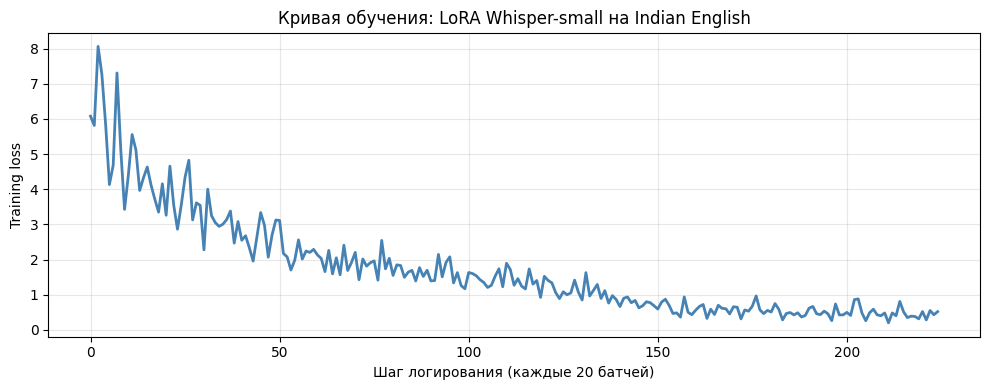

In [33]:
# Кривая обучения
fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(loss_history, color="steelblue", linewidth=2)
ax.set_xlabel("Шаг логирования (каждые 20 батчей)")
ax.set_ylabel("Training loss")
ax.set_title("Кривая обучения: LoRA Whisper-small на Indian English")
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig("loss_curve.png", dpi=150)
plt.show()

In [34]:
lora_model.generation_config.suppress_tokens = []

lora_model.config.suppress_tokens = None

lora_model.generation_config.forced_decoder_ids = None
lora_model.config.forced_decoder_ids = None

In [47]:
lora_model.eval()

print("Оценка lora_model на тестовых звонках...")
finetuned_preds, finetuned_refs = transcribe_batch(lora_model, processor, test_samples, verbose=True)
finetuned_wer = compute_wer(finetuned_preds, finetuned_refs)

print(f"\n=== Fine-tuned WER: {finetuned_wer:.3f} ({finetuned_wer*100:.1f}%) ===\n")
print(f"Baseline WER:          {baseline_wer_score:.3f} ({baseline_wer_score*100:.1f}%)")
print(f"Δ WER (baseline - fine-tuned): {baseline_wer_score - finetuned_wer:.3f}\n")

for i, (ref, pred_ft) in enumerate(zip(finetuned_refs, finetuned_preds)):
    pred_base = baseline_preds[i] if 'baseline_preds' in dir() else "N/A"
    is_exact_match = ref == pred_ft
    status = "✓" if is_exact_match else "✗"

    print(f"[{i}] {status}")
    print(f"  REF:        {ref}")
    print(f"  BASELINE:   {pred_base}")
    print(f"  FINE-TUNED: {pred_ft}")
    print()

[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


Оценка lora_model на тестовых звонках...


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [1/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [2/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [3/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [4/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [5/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [6/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [7/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [8/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [9/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [10/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [11/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [12/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [13/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [14/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [15/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [16/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [17/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [18/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [19/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [20/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [21/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [22/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [23/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [24/26]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [25/26]
  [26/26]

=== Fine-tuned WER: 0.196 (19.6%) ===

Baseline WER:          0.198 (19.8%)
Δ WER (baseline - fine-tuned): 0.002

[0] ✗
  REF:        i have updated your delivery address to 425 oak street
  BASELINE:   i have updated your delivery address to 4 5 oak street
  FINE-TUNED: i have updated your delivery address to 4 5 oak street

[1] ✓
  REF:        your package was shipped via fedex and is currently in transit
  BASELINE:   your package was shipped via fedex and is currently in transit
  FINE-TUNED: your package was shipped via fedex and is currently in transit

[2] ✗
  REF:        please log in to your account on our website to confirm
  BASELINE:   please log into your account on our website to confirm
  FINE-TUNED: please log into your account on our website to confirm

[3] ✓
  REF:        please note your support ticket number is 7390
  BASELINE:   please note your support ticket number is 7390
  FINE-TUNED: please note your support ticket number is 7390

[4] ✗
  

In [51]:
test_samples = list(test_dataset)

In [52]:
base_preds, base_refs = transcribe_batch(baseline_model, processor, test_samples, verbose=False)
base_wer = compute_wer(base_preds, base_refs)

ft_preds, ft_refs = transcribe_batch(lora_model, processor, test_samples, verbose=False)
ft_wer = compute_wer(ft_preds, ft_refs)

print(f"Baseline WER:   {base_wer:.3f}")
print(f"Fine‑tuned WER: {ft_wer:.3f}")

[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface

Baseline WER:   0.176
Fine‑tuned WER: 0.174


###Подсчет WER после файнтьюнинга - 1 балла

Прогоните дообученную модель на тех же сгенерированных звонках и сравните WER бейзлайн модели и дообученной.
Перед инференсом переведите модель в режим оценивания с помощью model.eval(). Затем получите предсказания дообученной модели, посчитайте WER и сравните результат с WER baseline-модели.

Проанализируйте результаты и ответьте на **вопросы**:

1. Улучшилась ли модель после дообучения? На основании каких результатов вы делаете этот вывод?

Если смотреть по результатам на метриках качество осталась практически такое же. Есть небольшие улучшения но они не знчительны. На исходном наборе (26 фраз) WER снизился с 19.8% до 19.6%.
На расширенном наборе (390 примеров, 15 голосов на фразу) WER снизился с 17.6% до 17.4%.

2.  Есть ли примеры, где fine-tuned модель стала хуже baseline? Как вы думаете, почему это могло произойти?

Есть пример
Baseline: "could you please spell yeah i have the correct spelling"
Fine‑tuned: "could you please spell it yeah i have the correct spelling"
Появилось лишнее слово "it" – однако все равно большая часть фразы пропущена, нельзя одназначно сказать что это ухудшение так как возможно модель попыталась распознать последующий пропуск.
Основной паттерн ошибок остался тот же самый.
В еденичных случаях, глобально, модель при дообучении может выучить неправильные паттерны, или переобучится.

В Svarah тоже есть редкие ухудшения (например, bokeh вместо book).

3. Какие дополнительные эксперименты вы бы провели, чтобы убедиться, что fine-tuning действительно улучшил качество модели?

Дополнительно я посчитала метрику сразу на всех вариантах синтезированного голоса, так как качество воспроизведения фраз разнилось на голосе.
Однако получившиеся примеры синтеза далеки от реального акцента, на мой взляд. Так что дообучение на сгенерированных голосах могут быть не совсем релевантны.

На реальном датасете Svarah - улучшение значительное:
Baseline WER: 11.5%
Fine‑tuned WER: 8.0%



In [55]:
import os
import torch
import torchaudio
import numpy as np
from datasets import load_dataset

svarah = load_dataset("ai4bharat/Svarah", split="test", streaming=True, token=os.environ["HF_TOKEN"])
MAX_DURATION = 20.0
TARGET = 50
collected = []

for sample in svarah:
    if len(collected) >= TARGET:
        break
    audio_info = sample["audio_filepath"]
    audio_array = audio_info["array"]
    sr = audio_info["sampling_rate"]
    text = sample["text"]
    duration = sample.get("duration", len(audio_array) / sr)
    if duration > MAX_DURATION:
        continue
    if sr != 16000:
        audio_tensor = torch.tensor(audio_array).float().unsqueeze(0)
        audio_array = torchaudio.functional.resample(audio_tensor, sr, 16000).squeeze().numpy()
    audio_array = audio_array.astype(np.float32)
    collected.append({
        "audio": {"array": audio_array, "sampling_rate": 16000},
        "sentence": text
    })

test_samples_svarah = collected[-50:]
print(f"Размер тестовой выборки: {len(test_samples_svarah)}")

README.md:   0%|          | 0.00/4.30k [00:00<?, ?B/s]

Размер тестовой выборки: 50


In [56]:
print("\nBaseline evaluation на Svarah...")
base_preds, base_refs = transcribe_batch(baseline_model, processor, test_samples_svarah, verbose=True)
base_wer = compute_wer(base_preds, base_refs)
print(f"\n=== Baseline WER на Svarah: {base_wer:.3f} ({base_wer*100:.1f}%) ===\n")

print("\nFine‑tuned (lora_model) evaluation на Svarah...")
ft_preds, ft_refs = transcribe_batch(lora_model, processor, test_samples_svarah, verbose=True)
ft_wer = compute_wer(ft_preds, ft_refs)
print(f"\n=== Fine‑tuned WER на Svarah: {ft_wer:.3f} ({ft_wer*100:.1f}%) ===\n")

print(f"Baseline WER:   {base_wer:.3f}")
print(f"Fine‑tuned WER: {ft_wer:.3f}")
print(f"Δ (base - ft):  {base_wer - ft_wer:.3f}\n")

for i, (ref, base_pred, ft_pred) in enumerate(zip(base_refs, base_preds, ft_preds)):
    is_exact_match_ft = (ref == ft_pred)
    status = "✓" if is_exact_match_ft else "✗"
    print(f"[{i}] {status}")
    print(f"  REF:        {ref}")
    print(f"  BASELINE:   {base_pred}")
    print(f"  FINE‑TUNED: {ft_pred}")
    print()

[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)



Baseline evaluation на Svarah...


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [1/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [2/50]
  [3/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [4/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [5/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [6/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [7/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [8/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [9/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [10/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [11/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [12/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [13/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [14/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [15/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [16/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [17/50]
  [18/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [19/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [20/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [21/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [22/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [23/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [24/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [25/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [26/50]
  [27/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [28/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [29/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [30/50]
  [31/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [32/50]
  [33/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [34/50]
  [35/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [36/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [37/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [38/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [39/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [40/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [41/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [42/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [43/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [44/50]
  [45/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [46/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [47/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [48/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [49/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [50/50]

=== Baseline WER на Svarah: 0.115 (11.5%) ===


Fine‑tuned (lora_model) evaluation на Svarah...


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [1/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [2/50]
  [3/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [4/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [5/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [6/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [7/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [8/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [9/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [10/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [11/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [12/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [13/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [14/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [15/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [16/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [17/50]
  [18/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [19/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [20/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [21/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [22/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [23/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [24/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [25/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [26/50]
  [27/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [28/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [29/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [30/50]
  [31/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)
[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [32/50]
  [33/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [34/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [35/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [36/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [37/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [38/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [39/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [40/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [41/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [42/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [43/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [44/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [45/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [46/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [47/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [48/50]


[transformers] Both `max_new_tokens` (=200) and `max_length`(=448) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


  [49/50]
  [50/50]

=== Fine‑tuned WER на Svarah: 0.080 (8.0%) ===

Baseline WER:   0.115
Fine‑tuned WER: 0.080
Δ (base - ft):  0.036

[0] ✗
  REF:        our district hasana was the land of the great hoysala dynasty who ruled over this region from 11th to 14th century ce
  BASELINE:   our district hasena was the land of the great hoisella dynasty who ruled over this region from 11th to 14th century ce
  FINE‑TUNED: our district hasena was the land of the great hoisella dynasty who ruled over this region from 11th to 14th century ce

[1] ✓
  REF:        there is a gradual shift in the mentality
  BASELINE:   there is a gradual shift in the mentality
  FINE‑TUNED: there is a gradual shift in the mentality

[2] ✓
  REF:        wow
  BASELINE:   wow
  FINE‑TUNED: wow

[3] ✓
  REF:        nipah virus belongs to the
  BASELINE:   nipah virus belongs to the
  FINE‑TUNED: nipah virus belongs to the

[4] ✓
  REF:        how much money is left in my arunachal pradesh rural bank account
  BASEL